In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd drive/My Drive

/content/drive/My Drive


In [ ]:
# try:
#   %tensorflow_version 2.x
# except Exception:
#   pass
import tensorflow as tf
print(tf.__version__)

2.8.0


In [ ]:
import string
from numpy import array
from pickle import load
from keras.preprocessing.text import Tokenizer
import matplotlib.pyplot as plt
from keras.backend import set_session
import keras
import sys, time, os, warnings 
warnings.filterwarnings("ignore")
import re

import numpy as np
import pandas as pd 
from PIL import Image
import pickle
from collections import Counter
from keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense, BatchNormalization
from keras.layers import LSTM
from keras.layers import Embedding
from keras.layers import Dropout
from keras.layers.merge import add
from keras.callbacks import ModelCheckpoint
from keras.preprocessing.image import load_img, img_to_array
from sklearn.utils import shuffle
from keras.applications.vgg16 import VGG16, preprocess_input

from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

# Utility Functions to load and clean data

In [ ]:
def load_doc(filename):
	file = open(filename, 'r')
	text = file.read()
	file.close()
	return text

def remove_punctuation(text_original):
    text_no_punctuation = text_original.translate(string.punctuation)
    return(text_no_punctuation)


def remove_single_character(text):
    text_len_more_than1 = ""
    for word in text.split():
        if len(word) > 1:
            text_len_more_than1 += " " + word
    return(text_len_more_than1)

def remove_numeric(text,printTF=False):
    text_no_numeric = ""
    for word in text.split():
        isalpha = word.isalpha()
        if printTF:
            print("    {:10} : {:}".format(word,isalpha))
        if isalpha:
            text_no_numeric += " " + word
    return(text_no_numeric)

In [ ]:
cd archive

[Errno 2] No such file or directory: 'archive'
/content/drive/My Drive


In [ ]:
cd /content/drive/MyDrive/captions/Image-Captioning-using-Attention-Mechanism-Local-Attention-and-Global-Attention-/

/content/drive/MyDrive/captions/Image-Captioning-using-Attention-Mechanism-Local-Attention-and-Global-Attention-


In [ ]:
from os import listdir
## The location of the Flickr8K_ photos
image_dir = 'archive/Images'
images = listdir(image_dir)

## The location of the caption file
descriptions_dir = 'archive/captions.txt'

print("The number of jpg flies in Flicker8k: {}".format(len(images)))

The number of jpg flies in Flicker8k: 16200


In [ ]:
text = load_doc(descriptions_dir)
print(text[:325])

image,caption
1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .
1000268201_693b08cb0e.jpg,A girl going into a wooden building .
1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playho


In [ ]:
def make_dataset(text):
  df = []
  for sentences in text.split('\n'):
      splitted = sentences.split(',')
      if len(splitted) == 1:
          continue
      w = splitted[0].split(",")
      df.append(w + [splitted[1].lower()])
  return df

In [ ]:
text

'image,caption\n1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .\n1000268201_693b08cb0e.jpg,A girl going into a wooden building .\n1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .\n1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playhouse .\n1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a wooden cabin .\n1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting\n1001773457_577c3a7d70.jpg,A black dog and a tri-colored dog playing with each other on the road .\n1001773457_577c3a7d70.jpg,A black dog and a white dog with brown spots are staring at each other in the street .\n1001773457_577c3a7d70.jpg,Two dogs of different breeds looking at each other on the road .\n1001773457_577c3a7d70.jpg,Two dogs on pavement moving toward each other .\n1002674143_1b742ab4b8.jpg,A little girl covered in paint sits in front of a painted rainbow with her hands in a bowl .\n10026741

In [ ]:
df = make_dataset(text)

In [ ]:
df[:10]

[['image', 'caption'],
 ['1000268201_693b08cb0e.jpg',
  'a child in a pink dress is climbing up a set of stairs in an entry way .'],
 ['1000268201_693b08cb0e.jpg', 'a girl going into a wooden building .'],
 ['1000268201_693b08cb0e.jpg',
  'a little girl climbing into a wooden playhouse .'],
 ['1000268201_693b08cb0e.jpg',
  'a little girl climbing the stairs to her playhouse .'],
 ['1000268201_693b08cb0e.jpg',
  'a little girl in a pink dress going into a wooden cabin .'],
 ['1001773457_577c3a7d70.jpg', 'a black dog and a spotted dog are fighting'],
 ['1001773457_577c3a7d70.jpg',
  'a black dog and a tri-colored dog playing with each other on the road .'],
 ['1001773457_577c3a7d70.jpg',
  'a black dog and a white dog with brown spots are staring at each other in the street .'],
 ['1001773457_577c3a7d70.jpg',
  'two dogs of different breeds looking at each other on the road .']]

In [ ]:
data = pd.DataFrame(df,columns=["filename","caption"])
data = data.reindex(columns =['filename','caption'])

In [ ]:

data=data.drop([0])

In [ ]:
data

,filename,caption
1,1000268201_693b08cb0e.jpg,a child in a pink dress is climbing up a set o...
2,1000268201_693b08cb0e.jpg,a girl going into a wooden building .
3,1000268201_693b08cb0e.jpg,a little girl climbing into a wooden playhouse .
4,1000268201_693b08cb0e.jpg,a little girl climbing the stairs to her playh...
5,1000268201_693b08cb0e.jpg,a little girl in a pink dress going into a woo...
...,...,...
40451,997722733_0cb5439472.jpg,a man in a pink shirt climbs a rock face
40452,997722733_0cb5439472.jpg,a man is rock climbing high in the air .
40453,997722733_0cb5439472.jpg,a person in a red shirt climbing up a rock fac...
40454,997722733_0cb5439472.jpg,a rock climber in a red shirt .


In [ ]:
def invalid_filename_check(data):
  for filenames in data["filename"]:
    found = re.search("(.(jpg)$)", filenames)
    if (found):
        pass
    else:
        print("Error file: {}".format(filenames))

In [ ]:
invalid_filename_check(data)

In [ ]:
data[data['filename'] == "2258277193_586949ec62.jpg.1"]

,filename,caption


In [ ]:
data = data[data['filename'] != '2258277193_586949ec62.jpg.1']
data.shape

(40455, 2)

In [ ]:
def utility_counter(data):

  unique_filenames = np.unique(data.filename.values)
  print("The number of unique file names : {}".format(len(unique_filenames)))

  ct_dict = Counter(data.filename.values)
  print("We can see that all the keys are having values count = 5")
  print(ct_dict)

  print("The distribution of the number of captions for each image:")
  ct = Counter(Counter(data.filename.values).values())
  print(ct)
  return unique_filenames

In [ ]:
unique_filenames = utility_counter(data)

The number of unique file names : 8091
We can see that all the keys are having values count = 5
Counter({'1000268201_693b08cb0e.jpg': 5, '1001773457_577c3a7d70.jpg': 5, '1002674143_1b742ab4b8.jpg': 5, '1003163366_44323f5815.jpg': 5, '1007129816_e794419615.jpg': 5, '1007320043_627395c3d8.jpg': 5, '1009434119_febe49276a.jpg': 5, '1012212859_01547e3f17.jpg': 5, '1015118661_980735411b.jpg': 5, '1015584366_dfcec3c85a.jpg': 5, '101654506_8eb26cfb60.jpg': 5, '101669240_b2d3e7f17b.jpg': 5, '1016887272_03199f49c4.jpg': 5, '1019077836_6fc9b15408.jpg': 5, '1019604187_d087bf9a5f.jpg': 5, '1020651753_06077ec457.jpg': 5, '1022454332_6af2c1449a.jpg': 5, '1022454428_b6b660a67b.jpg': 5, '1022975728_75515238d8.jpg': 5, '102351840_323e3de834.jpg': 5, '1024138940_f1fefbdce1.jpg': 5, '102455176_5f8ead62d5.jpg': 5, '1026685415_0431cbf574.jpg': 5, '1028205764_7e8df9a2ea.jpg': 5, '1030985833_b0902ea560.jpg': 5, '103106960_e8a41d64f8.jpg': 5, '103195344_5d2dc613a3.jpg': 5, '103205630_682ca7285b.jpg': 5, '10321

In [ ]:
def image_desc_plotter(data):
  npic = 5
  npix = 224
  target_size = (npix,npix,3)

  count = 1
  fig = plt.figure(figsize=(10,20))
  for jpgfnm in unique_filenames[20:25]:
      filename = image_dir + '/' + jpgfnm
      captions = list(data["caption"].loc[data["filename"]==jpgfnm].values)
      image_load = load_img(filename, target_size=target_size)
      
      ax = fig.add_subplot(npic,2,count,xticks=[],yticks=[])
      ax.imshow(image_load)
      count += 1
      
      ax = fig.add_subplot(npic,2,count)
      plt.axis('off')
      ax.plot()
      ax.set_xlim(0,1)
      ax.set_ylim(0,len(captions))
      for i, caption in enumerate(captions):
          ax.text(0,i,caption,fontsize=20)
      count += 1
  plt.show()

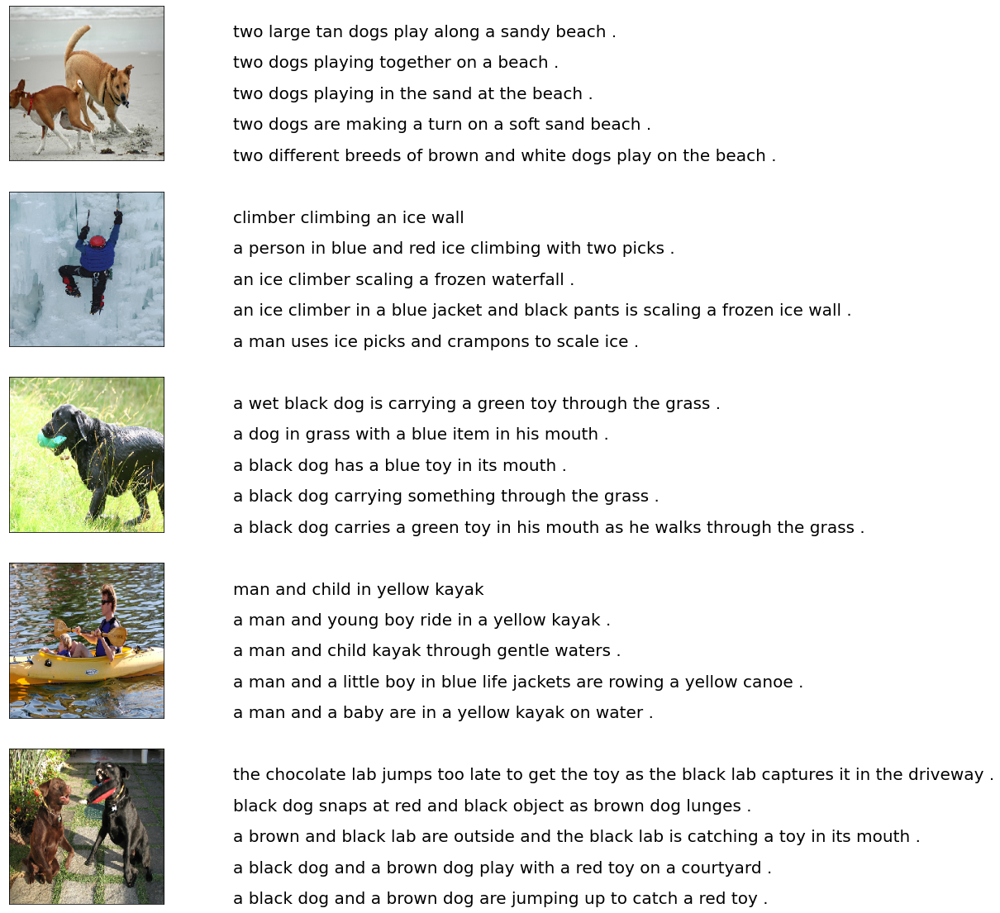

In [ ]:
image_desc_plotter(data)

In [ ]:
def create_vocabulary(data):
  vocab = []
  for captions in data.caption.values:
    vocab.extend(captions.split())
  print("Vocabulary Size : {}".format(len(set(vocab))))
  return vocab

In [ ]:
vocabulary = create_vocabulary(data)

Vocabulary Size : 8871


In [ ]:
def df_word_count(data,vocabulary):
    ct = Counter(vocabulary)
    appen_1 = []
    appen_2 = []
    for i in ct.keys():
        appen_1.append(i)
    for j in ct.values():
        appen_2.append(j)
    data = {"word":appen_1 , "count":appen_2}
    dfword = pd.DataFrame(data)
    dfword = dfword.sort_values(by='count', ascending=False)
    dfword = dfword.reset_index()[["word","count"]]
    return(dfword)

In [ ]:
dfwordcount = df_word_count(data,vocabulary)

In [ ]:
dfwordcount.iloc[:10,:]

,word,count
0,a,60196
1,.,34205
2,in,18174
3,the,17507
4,on,10357
5,is,9069
6,and,8057
7,dog,7948
8,with,7304
9,man,7137


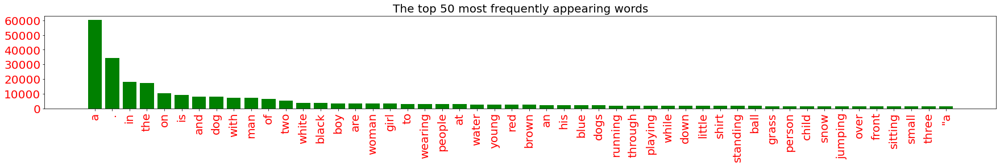

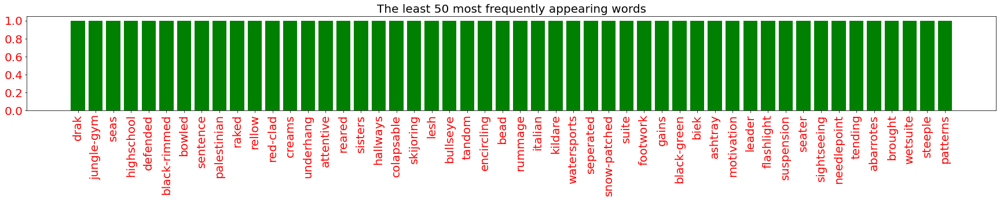

In [ ]:
topn = 50

def plthist(dfsub, title="The top 50 most frequently appearing words"):
    plt.figure(figsize=(30,3))
    plt.bar(dfsub.index,dfsub["count"],color ='g')
    plt.yticks(fontsize=20,color ='r')
    plt.xticks(dfsub.index,dfsub["word"],rotation=90,fontsize=20,color ='r')
    plt.title(title,fontsize=20)
    plt.show()

plthist(dfwordcount.iloc[:topn,:],
        title="The top 50 most frequently appearing words")
plthist(dfwordcount.iloc[-topn:,:],
        title="The least 50 most frequently appearing words")

In [ ]:
def text_clean(text_original):
    text = remove_punctuation(text_original)
    text = remove_single_character(text)
    text = remove_numeric(text)
    return(text)
    
for i, caption in enumerate(data.caption.values):
    newcaption = text_clean(caption)
    data["caption"].iloc[i] = newcaption

In [ ]:
clean_vocabulary = create_vocabulary(data)

Vocabulary Size : 8182


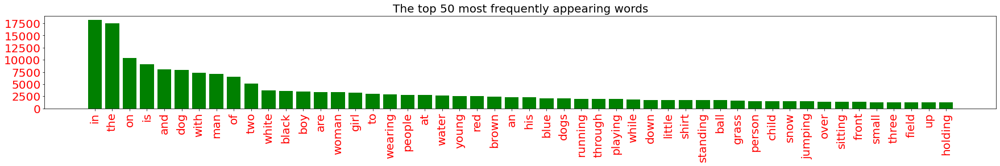

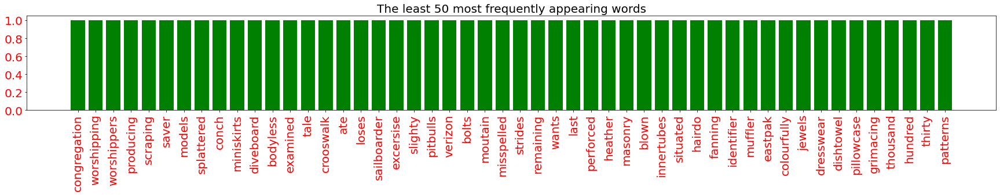

In [ ]:
dfwordcount = df_word_count(data,clean_vocabulary)
plthist(dfwordcount.iloc[:topn,:],
        title="The top 50 most frequently appearing words")
plthist(dfwordcount.iloc[-topn:,:],
        title="The least 50 most frequently appearing words")

In [ ]:
def preprocess_images(data):
  all_img_name_vector = []

  for filenames in data["filename"]:
      full_image_path = image_dir+"/"+ filenames
      all_img_name_vector.append(full_image_path)
  return all_img_name_vector
all_img_name_vector = preprocess_images(data)
all_img_name_vector[:10]

['archive/Images/1000268201_693b08cb0e.jpg',
 'archive/Images/1000268201_693b08cb0e.jpg',
 'archive/Images/1000268201_693b08cb0e.jpg',
 'archive/Images/1000268201_693b08cb0e.jpg',
 'archive/Images/1000268201_693b08cb0e.jpg',
 'archive/Images/1001773457_577c3a7d70.jpg',
 'archive/Images/1001773457_577c3a7d70.jpg',
 'archive/Images/1001773457_577c3a7d70.jpg',
 'archive/Images/1001773457_577c3a7d70.jpg',
 'archive/Images/1001773457_577c3a7d70.jpg']

In [ ]:
def preprocess_captions(data): #appending <start> and <end>
  total_captions = []

  for caption  in data["caption"].astype(str):
      caption = '<start> ' + caption+ ' <end>'
      total_captions.append(caption)
  return total_captions
total_captions = preprocess_captions(data)
total_captions[:10]

['<start>  child in pink dress is climbing up set of stairs in an entry way <end>',
 '<start>  girl going into wooden building <end>',
 '<start>  little girl climbing into wooden playhouse <end>',
 '<start>  little girl climbing the stairs to her playhouse <end>',
 '<start>  little girl in pink dress going into wooden cabin <end>',
 '<start>  black dog and spotted dog are fighting <end>',
 '<start>  black dog and dog playing with each other on the road <end>',
 '<start>  black dog and white dog with brown spots are staring at each other in the street <end>',
 '<start>  two dogs of different breeds looking at each other on the road <end>',
 '<start>  two dogs on pavement moving toward each other <end>']

In [ ]:
ten_images = all_img_name_vector[:50] # Each image repeats 5 times in dataset
unique_images = np.unique(ten_images)
print(unique_images)

['archive/Images/1000268201_693b08cb0e.jpg'
 'archive/Images/1001773457_577c3a7d70.jpg'
 'archive/Images/1002674143_1b742ab4b8.jpg'
 'archive/Images/1003163366_44323f5815.jpg'
 'archive/Images/1007129816_e794419615.jpg'
 'archive/Images/1007320043_627395c3d8.jpg'
 'archive/Images/1009434119_febe49276a.jpg'
 'archive/Images/1012212859_01547e3f17.jpg'
 'archive/Images/1015118661_980735411b.jpg'
 'archive/Images/1015584366_dfcec3c85a.jpg']


In [ ]:
from matplotlib.pyplot import figure, imshow, axis
from matplotlib.image import imread

def showImagesHorizontally(ten_images):
    fig = figure()
    number_of_files = len(ten_images)
    for i in range(number_of_files):
        a=fig.add_subplot(1,number_of_files,i+1)
        image = imread(ten_images[i])
        imshow(image,cmap='Greys_r', aspect='equal', interpolation='nearest')
        axis('off')

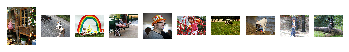

In [ ]:
showImagesHorizontally(unique_images)

In [ ]:
print("Total Images : " + str(len(all_img_name_vector)))
print("Total Captions : " + str(len(total_captions)))

Total Images : 40455
Total Captions : 40455


In [ ]:
def data_limiter(num,total_captions,all_img_name_vector):
  train_captions, img_name_vector = shuffle(total_captions,all_img_name_vector,random_state=1)
  train_captions = train_captions[:num]
  img_name_vector = img_name_vector[:num]
  return train_captions,img_name_vector

In [ ]:
train_captions,img_name_vector = data_limiter(40000,total_captions,all_img_name_vector)

In [ ]:
print("Total Captions = {0} , Total images = {1}".format(len(train_captions),len(img_name_vector)))

Total Captions = 40000 , Total images = 40000


In [ ]:
from pickle import dump #One to be run once as pickle file will be saved

# save to file
dump(train_captions, open('captions.pkl', 'wb'))
dump(img_name_vector, open('img_names.pkl', 'wb'))

In [ ]:
train_captions = load(open('captions.pkl', 'rb'))
img_name_vector = load(open('img_names.pkl', 'rb'))

In [ ]:
print("Total Captions = {0} , Total images = {1}".format(len(train_captions),len(img_name_vector)))

Total Captions = 40000 , Total images = 40000


In [ ]:
def img_shape_finder(image):
  img= plt.imread(image)

  print("Shape of the image ==> {0} is ==> {1}".format(image.split('/')[1],img.shape))

In [ ]:
img_list=[]
for i in range(20):
  img_list.append(img_name_vector[i])

In [ ]:
for j in img_list:
  img_shape_finder(j)

Shape of the image ==> Images is ==> (500, 375, 3)
Shape of the image ==> Images is ==> (375, 500, 3)
Shape of the image ==> Images is ==> (375, 500, 3)
Shape of the image ==> Images is ==> (400, 500, 3)
Shape of the image ==> Images is ==> (274, 500, 3)
Shape of the image ==> Images is ==> (375, 500, 3)
Shape of the image ==> Images is ==> (334, 500, 3)
Shape of the image ==> Images is ==> (500, 354, 3)
Shape of the image ==> Images is ==> (500, 333, 3)
Shape of the image ==> Images is ==> (350, 500, 3)
Shape of the image ==> Images is ==> (375, 500, 3)
Shape of the image ==> Images is ==> (375, 500, 3)
Shape of the image ==> Images is ==> (322, 500, 3)
Shape of the image ==> Images is ==> (375, 500, 3)
Shape of the image ==> Images is ==> (500, 333, 3)
Shape of the image ==> Images is ==> (333, 500, 3)
Shape of the image ==> Images is ==> (228, 500, 3)
Shape of the image ==> Images is ==> (500, 333, 3)
Shape of the image ==> Images is ==> (375, 500, 3)
Shape of the image ==> Images i

Shape of the image:(333, 500, 3)


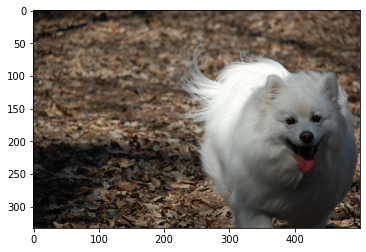

In [ ]:
def image_and_shapes(image):
  img= plt.imread(image)
  plt.imshow(img)
  print("Shape of the image:{}".format(img.shape))

image_and_shapes("archive/Images/3439243433_d5f3508612.jpg")

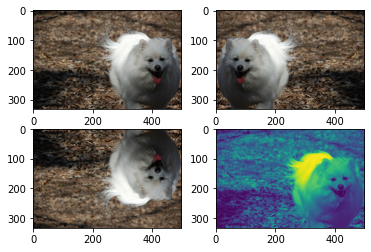

In [ ]:
import imageio
def image_flipper(image):
  original_img = imageio.imread(image)
  
  plt.figure(1)

#Original Image

  plt.subplot(221)
  plt.imshow(original_img)

#Left-Right flip Image

  flipped_img_tensor = tf.image.flip_left_right(original_img)
  flipped_img= flipped_img_tensor.numpy()
  plt.subplot(222)
  plt.imshow(flipped_img)

#Up-Down flip Image

  upside_down_flip_tensor = tf.image.flip_up_down(original_img)
  upside_down_flip= upside_down_flip_tensor.numpy()
  plt.subplot(223)
  plt.imshow(upside_down_flip)

#Gray scale Image

  gray_tensor = tf.image.rgb_to_grayscale(original_img)
  grayimg= gray_tensor.numpy()
  plt.subplot(224)
  plt.imshow(tf.squeeze(grayimg))

  #plt.imsave('doggo.jpg',flipped_img)

image_flipper("archive/Images/3439243433_d5f3508612.jpg")


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape after resize : (224, 224, 3)


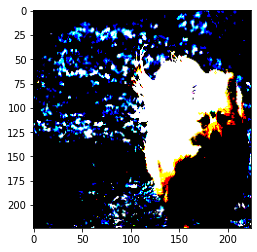

In [ ]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (224, 224))
    img = preprocess_input(img)
    return img, image_path

img1,img1_path = load_image("archive/Images/3439243433_d5f3508612.jpg")
print("Shape after resize :", img1.shape)
plt.imshow(img1)

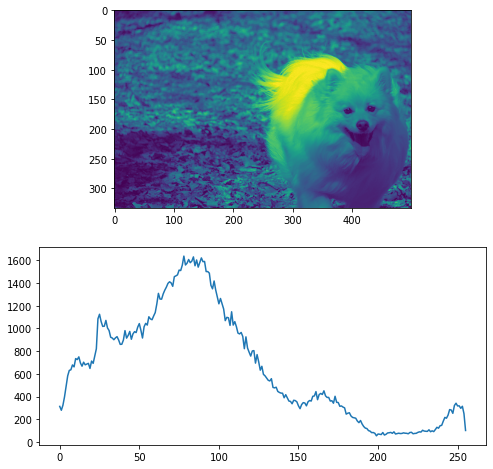

In [ ]:
import cv2 
from matplotlib import pyplot as plt 
def plot_image_histograms(image): 
  img = cv2.imread(image,0) 
  histr = cv2.calcHist([img],[0],None,[256],[0,256]) 
    
  fig = plt.figure(figsize=(8, 8))
  plt.subplot(2,1,1)
  plt.imshow(img)
  plt.subplot(2,1,2)
  plt.plot(histr) 
  plt.show() 

plot_image_histograms('archive/Images/3439243433_d5f3508612.jpg')

In [ ]:
import tensorflow as tf
modelvgg = tf.keras.applications.VGG16(include_top=True,weights=None) # for observation on shapes

In [ ]:
modelvgg.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
image_model = tf.keras.applications.VGG16(include_top=False,weights='imagenet')
new_input = image_model.input 
hidden_layer = image_model.layers[-1].output

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

58900480/58889256 [==============================] - 1s 0us/step


In [ ]:
image_features_extract_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

In [ ]:
# Get unique images
encode_train = sorted(set(img_name_vector))
print(encode_train[:10])

['archive/Images/1000268201_693b08cb0e.jpg', 'archive/Images/1001773457_577c3a7d70.jpg', 'archive/Images/1002674143_1b742ab4b8.jpg', 'archive/Images/1003163366_44323f5815.jpg', 'archive/Images/1007129816_e794419615.jpg', 'archive/Images/1007320043_627395c3d8.jpg', 'archive/Images/1009434119_febe49276a.jpg', 'archive/Images/1012212859_01547e3f17.jpg', 'archive/Images/1015118661_980735411b.jpg', 'archive/Images/1015584366_dfcec3c85a.jpg']


In [ ]:
from tqdm.notebook import tqdm
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
for files in tqdm(image_dataset): 
    print(files.numpy())

  0%|          | 0/8091 [00:00<?, ?it/s]

Streaming output truncated to the last 5000 lines.
b'archive/Images/2844747252_64567cf14a.jpg'
b'archive/Images/2844846111_8c1cbfc75d.jpg'
b'archive/Images/2844963839_ff09cdb81f.jpg'
b'archive/Images/2845246160_d0d1bbd6f0.jpg'
b'archive/Images/2845691057_d4ab89d889.jpg'
b'archive/Images/2845845721_d0bc113ff7.jpg'
b'archive/Images/2846037553_1a1de50709.jpg'
b'archive/Images/2846785268_904c5fcf9f.jpg'
b'archive/Images/2846843520_b0e6211478.jpg'
b'archive/Images/2847514745_9a35493023.jpg'
b'archive/Images/2847615962_c330bded6e.jpg'
b'archive/Images/2847859796_4d9cb0d31f.jpg'
b'archive/Images/2848266893_9693c66275.jpg'
b'archive/Images/2848571082_26454cb981.jpg'
b'archive/Images/2848895544_6d06210e9d.jpg'
b'archive/Images/2848977044_446a31d86e.jpg'
b'archive/Images/2849194983_2968c72832.jpg'
b'archive/Images/2850719435_221f15e951.jpg'
b'archive/Images/2851198725_37b6027625.jpg'
b'archive/Images/2851304910_b5721199bc.jpg'
b'archive/Images/2851931813_eaf8ed7be3.jpg'
b'archive/Images/28529820

In [ ]:
image_dataset = image_dataset.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(64)

In [ ]:
image_dataset

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.string, name=None))>

In [ ]:
from tqdm.notebook import tqdm

In [ ]:
# for img, path in tqdm(image_dataset): #Again to be run once npy files are saved
#   batch_features = image_features_extract_model(img)
#   batch_features = tf.reshape(batch_features,(batch_features.shape[0], -1, batch_features.shape[3]))
#   for bf, p in zip(batch_features, path):
#     path_of_feature = p.numpy().decode("utf-8")
#     np.save(path_of_feature, bf.numpy())

  0%|          | 0/127 [00:00<?, ?it/s]

In [ ]:
np_img =np.load('archive/Images/3338291921_fe7ae0c8f8.jpg.npy')

In [ ]:
print(np_img)
print("Shape : {}".format(np_img.shape))

[[0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 ...
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        3.9950945 0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]]
Shape : (49, 512)


In [ ]:
def tokenize_caption(top_k,train_captions):
  tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,oov_token="<unk>",filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
  
  tokenizer.fit_on_texts(train_captions)
  train_seqs = tokenizer.texts_to_sequences(train_captions)

  # Map '<pad>' to '0'
  tokenizer.word_index['<pad>'] = 0
  tokenizer.index_word[0] = '<pad>'


  # Create the tokenized vectors
  train_seqs = tokenizer.texts_to_sequences(train_captions)
  return train_seqs, tokenizer

train_seqs , tokenizer = tokenize_caption(5000,train_captions)

In [ ]:
train_captions[:3]

['<start>  several children leaping into pile of leaves on the ground <end>',
 '<start>  man hiking in the wilderness giving the camera thumbs up <end>',
 '<start>  white dog is running through the water onto the shore <end>']

In [ ]:
train_seqs[:3] # Here we can see that the sentences are converted to sequences

[[2, 185, 60, 332, 63, 506, 12, 328, 6, 5, 169, 3],
 [2, 11, 569, 4, 5, 2841, 895, 5, 94, 1270, 53, 3],
 [2, 14, 9, 7, 32, 33, 5, 24, 238, 5, 284, 3]]

In [ ]:
# oov_token: if given, it will be added to word_index and used to replace out-of-vocabulary words during text_to_sequence calls
tokenizer.oov_token

'<unk>'

In [ ]:
tokenizer.index_word

{1: '<unk>',
 2: '<start>',
 3: '<end>',
 4: 'in',
 5: 'the',
 6: 'on',
 7: 'is',
 8: 'and',
 9: 'dog',
 10: 'with',
 11: 'man',
 12: 'of',
 13: 'two',
 14: 'white',
 15: 'black',
 16: 'boy',
 17: 'are',
 18: 'woman',
 19: 'girl',
 20: 'to',
 21: 'wearing',
 22: 'people',
 23: 'at',
 24: 'water',
 25: 'young',
 26: 'red',
 27: 'brown',
 28: 'an',
 29: 'his',
 30: 'blue',
 31: 'dogs',
 32: 'running',
 33: 'through',
 34: 'playing',
 35: 'while',
 36: 'down',
 37: 'shirt',
 38: 'little',
 39: 'standing',
 40: 'ball',
 41: 'grass',
 42: 'person',
 43: 'child',
 44: 'snow',
 45: 'jumping',
 46: 'over',
 47: 'front',
 48: 'sitting',
 49: 'small',
 50: 'three',
 51: 'field',
 52: 'holding',
 53: 'up',
 54: 'large',
 55: 'group',
 56: 'by',
 57: 'green',
 58: 'yellow',
 59: 'walking',
 60: 'children',
 61: 'her',
 62: 'men',
 63: 'into',
 64: 'beach',
 65: 'air',
 66: 'near',
 67: 'jumps',
 68: 'mouth',
 69: 'street',
 70: 'runs',
 71: 'for',
 72: 'another',
 73: 'riding',
 74: 'from',
 75: '

In [ ]:
tokenizer.word_counts

OrderedDict([('<start>', 40000),
             ('several', 291),
             ('children', 1116),
             ('leaping', 129),
             ('into', 1039),
             ('pile', 73),
             ('of', 6421),
             ('leaves', 132),
             ('on', 10240),
             ('the', 17325),
             ('ground', 331),
             ('<end>', 40000),
             ('man', 7066),
             ('hiking', 62),
             ('in', 17979),
             ('wilderness', 4),
             ('giving', 32),
             ('camera', 651),
             ('thumbs', 18),
             ('up', 1199),
             ('white', 3668),
             ('dog', 7860),
             ('is', 8992),
             ('running', 1972),
             ('through', 1959),
             ('water', 2650),
             ('onto', 204),
             ('shore', 156),
             ('young', 2556),
             ('relaxing', 15),
             ('his', 2225),
             ('legs', 121),
             ('pice', 1),
             ('machinery', 1),

In [ ]:
# Find the maximum length of any caption in our dataset
def calc_max_length(tensor):
    return max(len(t) for t in tensor)
# Calculates the max_length, which is used to store the attention weights
max_length = calc_max_length(train_seqs)

In [ ]:
# Find the maximum length of any caption in our dataset
def calc_min_length(tensor):
    return min(len(t) for t in tensor)
# Calculates the max_length, which is used to store the attention weights
min_length = calc_min_length(train_seqs)

In [ ]:
print('Max Length of any caption : Min Length of any caption = '+ str(max_length) +" : "+str(min_length))

Max Length of any caption : Min Length of any caption = 31 : 2


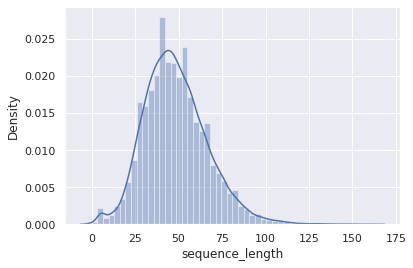

In [ ]:
import seaborn as sns

df=pd.DataFrame()
df["sequence_length"] = data["caption"].apply(len)

sns.set()
distribution = sns.distplot(df["sequence_length"])

In [ ]:
def padding_train_sequences(train_seqs,max_length,padding_type):
  cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding=padding_type,maxlen=max_length)
  return cap_vector

In [ ]:
padded_caption_vector = padding_train_sequences(train_seqs,max_length,'post')
print(padded_caption_vector.shape)

(40000, 31)


In [ ]:
padded_caption_vector

array([[  2, 185,  60, ...,   0,   0,   0],
       [  2,  11, 569, ...,   0,   0,   0],
       [  2,  14,   9, ...,   0,   0,   0],
       ...,
       [  2,  19,   4, ...,   0,   0,   0],
       [  2,  16,   4, ...,   0,   0,   0],
       [  2, 151,   9, ...,   0,   0,   0]], dtype=int32)

## Train-Test Split (80:20)

In [ ]:
img_name_train, img_name_test, caption_train, caption_test = train_test_split(img_name_vector,padded_caption_vector,test_size=0.2,random_state=0)

In [ ]:
print("Training Data : X = {0},Y = {1}".format(len(img_name_train), len(caption_train)))
print("Test Data : X = {0},Y = {1}".format(len(img_name_test), len(caption_test)))

Training Data : X = 32000,Y = 32000
Test Data : X = 8000,Y = 8000


In [ ]:

BATCH_SIZE = 64
BUFFER_SIZE = 1000

In [ ]:
def load_npy(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap

In [ ]:

def create_dataset(img_name_train,caption_train):

  
  dataset = tf.data.Dataset.from_tensor_slices((img_name_train, caption_train))

  # Use map to load the numpy files in parallel
  dataset = dataset.map(lambda item1, item2: tf.numpy_function(load_npy, [item1, item2], [tf.float32, tf.int32]),num_parallel_calls=tf.data.experimental.AUTOTUNE)

  # Shuffle and batch
  dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
  return dataset


In [ ]:
# Creating train and test dataset
dataset = create_dataset(img_name_train,caption_train)
test_dataset = create_dataset(img_name_test,caption_test)

In [ ]:
embedding_dim = 256
units = 512
vocab_size = len(tokenizer.word_index) + 1 #8329
num_steps = len(img_name_train) // BATCH_SIZE  #500
EPOCHS = 20
# Shape from last layer of VGG-16 :(7,7,512)
# So, say there are 49 pixel locations now and each pixel is 512 dimensional
features_shape = 512
attention_features_shape = 49 

In [ ]:
class VGG16_Encoder(tf.keras.Model):
    def __init__(self, embedding_dim):
        super(VGG16_Encoder, self).__init__()
        # shape after fc == (batch_size, 49, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)
        self.dropout = tf.keras.layers.Dropout(0.5, noise_shape=None, seed=None)

    def call(self, x):
        #x= self.dropout(x)
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x        

In [ ]:
def rnn_type(units):
    if tf.test.is_gpu_available():
        return tf.compat.v1.keras.layers.CuDNNLSTM(units, 
                                        return_sequences=True, 
                                        return_state=True, 
                                        recurrent_initializer='glorot_uniform')
    else:
        return tf.keras.layers.GRU(units, 
                                   return_sequences=True, 
                                   return_state=True, 
                                   recurrent_activation='sigmoid', 
                                   recurrent_initializer='glorot_uniform')

In [ ]:
class Rnn_Local_Decoder(tf.keras.Model):
  def __init__(self, embedding_dim, units, vocab_size):
    super(Rnn_Local_Decoder, self).__init__()
    self.units = units

    self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
    self.gru = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
    
    self.fc1 = tf.keras.layers.Dense(self.units)

    self.dropout = tf.keras.layers.Dropout(0.5, noise_shape=None, seed=None)
    self.batchnormalization = tf.keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001, center=True, scale=True, beta_initializer='zeros', gamma_initializer='ones', moving_mean_initializer='zeros', moving_variance_initializer='ones', beta_regularizer=None, gamma_regularizer=None, beta_constraint=None, gamma_constraint=None)

    self.fc2 = tf.keras.layers.Dense(vocab_size)

    # Implementing Attention Mechanism 
    self.Uattn = tf.keras.layers.Dense(units)
    self.Wattn = tf.keras.layers.Dense(units)
    self.Vattn = tf.keras.layers.Dense(1)
    


  def call(self, x, features, hidden):
    
    # features shape ==> (64,49,256) ==> Output from ENCODER
    
    # hidden shape == (batch_size, hidden_size) ==>(64,512)
    # hidden_with_time_axis shape == (batch_size, 1, hidden_size) ==> (64,1,512)
    
    hidden_with_time_axis = tf.expand_dims(hidden, 1)
    
    # score shape == (64, 49, 1)
    # Attention Function
    '''e(ij) = f(s(t-1),h(j))'''
    ''' e(ij) = Vattn(T)*tanh(Uattn * h(j) + Wattn * s(t))'''
    score = self.Vattn(tf.nn.tanh(self.Uattn(features) + self.Wattn(hidden_with_time_axis)))
    # self.Uattn(features) : (64,49,512)
    # self.Wattn(hidden_with_time_axis) : (64,1,512)
    # tf.nn.tanh(self.Uattn(features) + self.Wattn(hidden_with_time_axis)) : (64,49,512)
    # self.Vattn(tf.nn.tanh(self.Uattn(features) + self.Wattn(hidden_with_time_axis))) : (64,49,1) ==> score
    # you get 1 at the last axis because you are applying score to self.Vattn
    
    
    # Then find Probability using Softmax
    '''attention_weights(alpha(ij)) = softmax(e(ij))'''
    attention_weights = tf.nn.softmax(score, axis=1)
    # attention_weights shape == (64, 49, 1)

    
    # Give weights to the different pixels in the image
    ''' C(t) = Summation(j=1 to T) (attention_weights * VGG-16 features) ''' 
    context_vector = attention_weights * features
    context_vector = tf.reduce_sum(context_vector, axis=1)
    # Context Vector(64,256) = AttentionWeights(64,49,1) * features(64,49,256)
    # context_vector shape after sum == (64, 256)
    
    
    # x shape after passing through embedding == (64, 1, 256)
    x = self.embedding(x)
    
    # x shape after concatenation == (64, 1,  512)
    x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

    # passing the concatenated vector to the GRU
    output, state = self.gru(x)

    # shape == (batch_size, max_length, hidden_size)
    x = self.fc1(output)

    # x shape == (batch_size * max_length, hidden_size)
    x = tf.reshape(x, (-1, x.shape[2]))

    # Adding Dropout and BatchNorm Layers
    x= self.dropout(x)
    x= self.batchnormalization(x)
    # output shape == (64 * 512)
    x = self.fc2(x)
    # shape : (64 * 8329(vocab))
    return x, state, attention_weights

  def reset_state(self, batch_size):
    return tf.zeros((batch_size, self.units))

In [ ]:

def score_choose():
  scoring_type= input('Enter the scoring method: ')
  return scoring_type

In [ ]:
scoring_type=score_choose()

Enter the scoring method: general


In [ ]:
class Rnn_Global_Decoder(tf.keras.Model):
    def __init__(self, embedding_dim, units, vocab_size,scoring_type):
        super(Rnn_Global_Decoder, self).__init__()
        

        self.units = units
        self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
        
        
        
        self.gru = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
        
        self.wc = tf.keras.layers.Dense(units, activation='tanh')
        self.ws = tf.keras.layers.Dense(vocab_size)

        #For Attention
        self.wa = tf.keras.layers.Dense(units)
        self.wb = tf.keras.layers.Dense(units)
        
        #For Score 3 i.e. Concat score
        self.Vattn = tf.keras.layers.Dense(1)
        self.wd = tf.keras.layers.Dense(units, activation='tanh')

        self.scoring_type = scoring_type

        
    def call(self, sequence, features,hidden):
        
        # features : (64,49,256)
        # hidden : (64,512)
        
        embed = self.embedding(sequence)
        # embed ==> (64,1,256) ==> decoder_input after embedding (embedding dim=256)
       
        output, state = self.gru(embed)       
        #output :(64,1,512)

        score=0
        
        #Dot Score as per paper(Dot score : h_t (dot) h_s') (NB:just need to tweak gru units to 256)
        '''----------------------------------------------------------'''
        if(self.scoring_type=='dot'):
          xt=output #(64,1,512)
          xs=features #(256,49,64)  
          score = tf.matmul(xt, xs, transpose_b=True) 
               
          #score : (64,1,49)

        '''----------------------------------------------------------'''
        '''----------------------------------------------------------'''



        # General Score as per Paper ( General score: h_t (dot) Wa (dot) h_s')
        '''----------------------------------------------------------'''
        if(self.scoring_type=='general'):
          score = tf.matmul(output, self.wa(features), transpose_b=True)
          # score :(64,1,49)
        '''----------------------------------------------------------'''
        '''----------------------------------------------------------'''




        # Concat score as per paper (score: VT*tanh(W[ht;hs']))    
        '''----------------------------------------------------------'''
        #https://www.tensorflow.org/api_docs/python/tf/tile
        if(self.scoring_type=='concat'):
          tiled_features = tf.tile(features, [1,1,2]) #(64,49,512)
          tiled_output = tf.tile(output, [1,49,1]) #(64,49,512)
          
          concating_ht_hs = tf.concat([tiled_features,tiled_output],2) ##(64,49,1024)
          
          tanh_activated = self.wd(concating_ht_hs)
          score =self.Vattn(tanh_activated)
          #score :(64,49,1), but we want (64,1,49)
          score= tf.squeeze(score, 2)
          #score :(64,49)
          score = tf.expand_dims(score, 1)
          
          #score :(64,1,49)
        '''----------------------------------------------------------'''
        '''----------------------------------------------------------'''



        # alignment vector a_t
        alignment = tf.nn.softmax(score, axis=2)
        # alignment :(64,1,49)

        # context vector c_t is the average sum of encoder output
        context = tf.matmul(alignment, features)
        # context : (64,1,256)
        
        # Combine the context vector and the LSTM output
        
        output = tf.concat([tf.squeeze(context, 1), tf.squeeze(output, 1)], 1)
        # output: concat[(64,1,256):(64,1,512)] = (64,768)

        output = self.wc(output)
        # output :(64,512)

        # Finally, it is converted back to vocabulary space: (batch_size, vocab_size)
        logits = self.ws(output)
        # logits/predictions: (64,8239) i.e. (batch_size,vocab_size))

        return logits, state, alignment

    def reset_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [ ]:
attention_choice = input("Choose the type of Attention Mechanism you want to apply :")

Choose the type of Attention Mechanism you want to apply :local


In [ ]:
if(attention_choice=='local'):
    encoder = VGG16_Encoder(embedding_dim)
    decoder = Rnn_Local_Decoder(embedding_dim, units, vocab_size)

else:
    encoder = VGG16_Encoder(embedding_dim)
    decoder = Rnn_Global_Decoder(embedding_dim, units, vocab_size,scoring_type)


In [ ]:
decoder

In [ ]:
def Encoder_features(img_tensor, target):
  features = encoder(img_tensor)
  return features,target,img_tensor

for (batch, (img_tensor, target)) in tqdm(enumerate(dataset)):
  features,target,img_tensor= Encoder_features(img_tensor, target)


0it [00:00, ?it/s]

In [ ]:
target.shape # (batch_size,max_length)

TensorShape([64, 31])

In [ ]:
img_tensor.shape #(batch_size,attention_feature_shape,feature_shape)

TensorShape([64, 49, 512])

In [ ]:
features.shape #(batch_size,attention_feature_shape,feature_shape)

TensorShape([64, 49, 256])

In [ ]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)

In [ ]:
pwd

'/content/drive/MyDrive/captions/Image-Captioning-using-Attention-Mechanism-Local-Attention-and-Global-Attention-'

In [ ]:
checkpoint_path_ckpt = './CA_train'
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path_ckpt, max_to_keep=5)

In [ ]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])

In [ ]:
# Clear previous logs
!rm -rf ./logs/ 

In [ ]:

# Define our metrics
train_loss = tf.keras.metrics.Mean('train_loss', dtype=tf.float32)
# train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy('train_accuracy')

In [ ]:
import datetime
current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
train_log_dir = 'logs/gradient_tape/' + current_time + '/train'
test_log_dir = 'logs/gradient_tape/' + current_time + '/test'
train_summary_writer = tf.summary.create_file_writer(train_log_dir)
test_summary_writer = tf.summary.create_file_writer(test_log_dir)

In [ ]:
loss_plot = []

@tf.function
def train_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * BATCH_SIZE, 1)

  with tf.GradientTape() as tape:
      features = encoder(img_tensor)

      for i in range(1, target.shape[1]):
          # passing the features through the decoder
          #dec_input = tf.expand_dims(target[:, i], 1)
          predictions, hidden, _ = decoder(dec_input, features, hidden)

          loss += loss_function(target[:, i], predictions)

          # using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)
          

  total_loss = (loss / int(target.shape[1]))

  trainable_variables = encoder.trainable_variables + decoder.trainable_variables

  gradients = tape.gradient(loss, trainable_variables)

  optimizer.apply_gradients(zip(gradients, trainable_variables))

  #train_loss(loss)
  #train_accuracy(target, predictions)

  return loss, total_loss

In [ ]:
test_loss_plot = []

@tf.function
def test_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * BATCH_SIZE, 1)

  features = encoder(img_tensor)

  for i in range(1, target.shape[1]):
      # passing the features through the decoder

      
      predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
      # predictions : (64,8329)
      loss += loss_function(target[:, i], predictions)
      
      predicted_id = tf.argmax(predictions[0])
      dec_input = tf.expand_dims([predicted_id]*BATCH_SIZE, 1)
 

  total_loss = (loss / int(target.shape[1]))

  return loss, total_loss

## Training

In [ ]:
for epoch in range(start_epoch, 20):
    start = time.time()

    #For Train
    #================================================================
    total_loss_train = 0
    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss_train += t_loss
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss_train / num_steps)

    # Tensorboard 
    with train_summary_writer.as_default():
      tf.summary.scalar('LossPlotTrain', (total_loss_train/ num_steps), step=epoch)
      tf.summary.scalar('Train_loss', train_loss.result(), step=epoch)

    #For Test
    #================================================================
    total_loss_test = 0
    for (batch, (img_tensor, target)) in enumerate(test_dataset):
        batch_loss, t_loss = test_step(img_tensor, target)
        total_loss_test += t_loss
    # storing the epoch end loss value to plot later
    test_loss_plot.append(total_loss_test / num_steps) 

    # Tensorboard 
    with test_summary_writer.as_default():
      tf.summary.scalar('LossPlotTest', (total_loss_test/ num_steps), step=epoch)

    
    if epoch % 5 == 0:
      ckpt_manager.save()

    print ('Epoch {} TrainLoss {:.6f} TestLoss {:.6f}'.format(epoch + 1,(total_loss_train/num_steps),(total_loss_test/num_steps)))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))

In [ ]:

%reload_ext tensorboard
%tensorboard --logdir logs/gradient_tape

Reusing TensorBoard on port 6006 (pid 1961), started 5:16:09 ago. (Use '!kill 1961' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
ckpt_manager.checkpoints

['./train/checkpoints/ckpt-1',
 './train/checkpoints/ckpt-2',
 './train/checkpoints/ckpt-3',
 './train/checkpoints/ckpt-4']

In [ ]:
ckpt.restore("./train/checkpoints/ckpt-2")

In [ ]:
for label in [loss_plot,test_loss_plot]:
    plt.plot(label)
plt.legend()
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

## Greedy Approach

In [ ]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0) # Start token is <start> for LSTM
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.argmax(predictions[0]).numpy()
        result.append(tokenizer.index_word[predicted_id]) # Store the result or word predicted

        if tokenizer.index_word[predicted_id] == '<end>': # if you reach <end> token then return the result
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0) # Decoder input is the word predicted at previous timestep

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot

## Beam Search

In [ ]:
def evaluate(image, beam_index = 3):

    start = [tokenizer.word_index['<start>']]
    
    # result[0][0] = index of the starting word
    # result[0][1] = probability of the word predicted
    result = [[start, 0.0]]

    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)

    while len(result[0][0]) < max_length:
        i=0
        temp = []
        for s in result:

          predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

          attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()
          i=i+1
          # Getting the top <beam_index>(n) predictions
          word_preds = np.argsort(predictions[0])[-beam_index:]
          
          # creating a new list so as to put them via the model again
          for w in word_preds:       
            next_cap, prob = s[0][:], s[1]
            next_cap.append(w)
            prob += predictions[0][w]
            temp.append([next_cap, prob])
        result = temp
        # Sorting according to the probabilities
        result = sorted(result, reverse=False, key=lambda l: l[1])
        # Getting the top words
        result = result[-beam_index:]
        
        predicted_id = result[-1] # with Max Probability
        pred_list = predicted_id[0]
        
        prd_id = pred_list[-1] 
        if(prd_id!=3):
          dec_input = tf.expand_dims([prd_id], 0)  # Decoder input is the word predicted with highest probability among the top_k words predicted
        else:
          break

    result = result[-1][0]
    
    intermediate_caption = [tokenizer.index_word[i] for i in result]
    final_caption = []
    for i in intermediate_caption:
        if i != '<end>':
            final_caption.append(i)
            
        else:
            break

    attention_plot = attention_plot[:len(result), :]
    final_caption = ' '.join(final_caption[1:])
    return final_caption,attention_plot



In [ ]:
def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(10, 10))
    len_result = len(result)
    for l in range(len_result):
        temp_att = np.resize(attention_plot[l], (8, 8))
        ax = fig.add_subplot(len_result//2, len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

archive/Images/3188044631_ca3a9cc737.jpg
man with apron sitting christmas tree
BELU score: 11.633369384516797
Real Caption: man and woman stand in front of christmas tree <unk> single <unk>
Prediction Caption: man with apron sitting christmas tree
time took to Predict: 14 sec


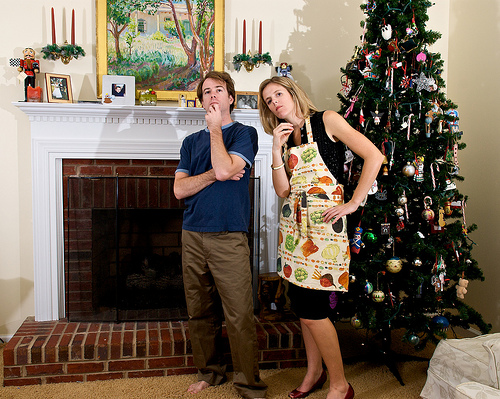

In [ ]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = img_name_test[rid]
print(image)
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions

print(result)
first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)

# print(result)
#remove <end> from result         
# result_join = ''.join(str(result))
# result_final = result_join.rsplit(' ', 1)[0]
result_final=result
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()


score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

#plot_attention(image, result_final, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

### Greedy Search

In [ ]:
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
print(real_caption)

<start> man and woman stand in front of christmas tree <unk> single <unk> <end>


archive/Images/2931950813_93145c4746.jpg
young boy is holding skateboard
BELU score: 24.543602502982406
Real Caption: the little boy stands next to his scooter
Prediction Caption: young boy is holding skateboard
time took to Predict: 0 sec


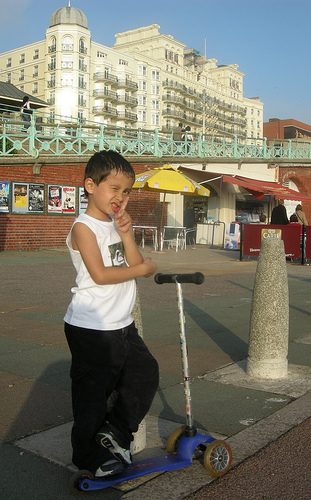

In [ ]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = img_name_test[rid]
print(image)
start = time.time()
real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions

print(result)
first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


#remove <end> from result         
# result_join = ' '.join(result)
# result_final = result_join.rsplit(' ', 1)[0]

result_final=result

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

#plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open(img_name_test[rid])

### Beam Search(b=3)

archive/Images/413231421_43833a11f5.jpg
dog is jumping over snowy ground
BELU score: 21.856064155801842
Real Caption: black dog is digging in the snow
Prediction Caption(Beam=3): dog is jumping over snowy ground


IndexError: ignored

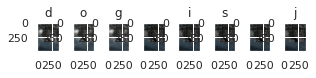

In [ ]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = 'archive/Images/413231421_43833a11f5.jpg'
print(image)
start = time.time()
real_caption = '<start> black dog is digging in the snow <end>'
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)
print(result)
#remove <end> from result         
# result_join = ' '.join(result)
# result_final = result_join.rsplit(' ', 1)[0]

result_final=result

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption(Beam=3):', result_final)

plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open('Flicker8k_Dataset/413231421_43833a11f5.jpg')

In [ ]:
score = sentence_bleu('black dog is digging in the snow', 'dog is digging in the snow', weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

BELU score: 65.04436355879909


## Beam Search(b=7)

archive/Images/413231421_43833a11f5.jpg
dog is jumping over snowy ground
BELU score: 21.856064155801842
Prediction Caption(Beam=7): dog is jumping over snowy ground


IndexError: ignored

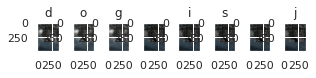

In [ ]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = 'archive/Images/413231421_43833a11f5.jpg'
print(image)
start = time.time()
real_caption = '<start> black dog is digging in the snow <end>'
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


print(result)
#remove <end> from result         
# result_join = ' '.join(result)
# result_final = result_join.rsplit(' ', 1)[0]

result_final=result

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

#print ('Real Caption:', real_caption)
print ('Prediction Caption(Beam=7):', result_final)

plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open('Flicker8k_Dataset/413231421_43833a11f5.jpg')

In [ ]:
score = sentence_bleu('black dog is digging in the snow', 'the dog is digging in snow', weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

BELU score: 65.04436355879909


## Beam Search(b=10)

archive/Images/413231421_43833a11f5.jpg
dog is jumping over snowy ground
BELU score: 21.856064155801842
Prediction Caption(Beam=10): dog is jumping over snowy ground
time took to Predict: 0 sec


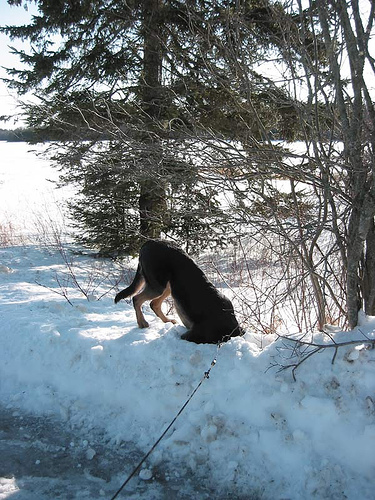

In [ ]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = 'archive/Images/413231421_43833a11f5.jpg'
print(image)
start = time.time()
real_caption = '<start> black dog is digging in the snow <end>'
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


print(result)
#remove <end> from result         
# result_join = ' '.join(result)
# result_final = result_join.rsplit(' ', 1)[0]

result_final=result

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

#print ('Real Caption:', real_caption)
print ('Prediction Caption(Beam=10):', result_final)

# plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open('archive/Images/413231421_43833a11f5.jpg')

In [ ]:
#########BLUE SCORING
def evaluate_beam(image, beam_index):

    start = [tokenizer.word_index['<start>']]
    
    # result[0][0] = index of the starting word
    # result[0][1] = probability of the word predicted
    result = [[start, 0.0]]

    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)

    while len(result[0][0]) < max_length:
        i=0
        temp = []
        for s in result:

          predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

          attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()
          i=i+1
          # Getting the top <beam_index>(n) predictions
          word_preds = np.argsort(predictions[0])[-beam_index:]
          
          # creating a new list so as to put them via the model again
          for w in word_preds:       
            next_cap, prob = s[0][:], s[1]
            next_cap.append(w)
            prob += predictions[0][w]
            temp.append([next_cap, prob])
        result = temp
        # Sorting according to the probabilities
        result = sorted(result, reverse=False, key=lambda l: l[1])
        # Getting the top words
        result = result[-beam_index:]
        
        predicted_id = result[-1] # with Max Probability
        pred_list = predicted_id[0]
        
        prd_id = pred_list[-1] 
        if(prd_id!=3):
          dec_input = tf.expand_dims([prd_id], 0)  # Decoder input is the word predicted with highest probability among the top_k words predicted
        else:
          break

    result = result[-1][0]
    
    intermediate_caption = [tokenizer.index_word[i] for i in result]
    final_caption = []
    for i in intermediate_caption:
        if i != '<end>':
            final_caption.append(i)
            
        else:
            break

    attention_plot = attention_plot[:len(result), :]
    final_caption = ' '.join(final_caption[1:])
    return final_caption,attention_plot



In [ ]:
############################################## CALCULATE BLEU
# captions on the validation set

from PIL import Image
# import time
from nltk.translate.bleu_score import sentence_bleu
# import tqdm.notebook as tqdm
start = time.time()
realcaps=[]
predcaps=[]
for image,caption in tqdm(zip(img_name_train[4000:4100],caption_train[4000:4100])):

  real_caption = ' '.join([tokenizer.index_word[i] for i in caption if i not in [0]])
  result, attention_plot = evaluate_beam(image,10)
  # result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
  # We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions
  first = real_caption.split(' ', 1)[1]
  real_caption = first.rsplit(' ', 1)[0]

  #remove "<unk>" in result
  for i in result:
      if i=="<unk>":
          result.remove(i)

#remove <end> from result         
# result_join = ' '.join(result)
# result_final = result_join.rsplit(' ', 1)[0]

  result_final=result
  real_appn = []
  real_appn.append(real_caption.split())
  reference = real_appn
  candidate = result_final.split()
  realcaps.append(reference)
  predcaps.append(candidate)

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

print ('Real Caption:', real_caption)
print ('Prediction Caption:', result_final)

#plot_attention(image, result_final, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")

In [ ]:
realcaps[1]

In [ ]:
predcaps[1]

In [ ]:
	print('BLEU-1: %f' % corpus_bleu(realcaps, predcaps, weights=(1.0, 0, 0, 0)))
	print('BLEU-2: %f' % corpus_bleu(realcaps, predcaps, weights=(0.5, 0.5, 0, 0)))
	print('BLEU-3: %f' % corpus_bleu(realcaps, predcaps, weights=(0.3, 0.3, 0.3, 0)))
	print('BLEU-4: %f' % corpus_bleu(realcaps, predcaps, weights=(0.25, 0.25, 0.25, 0.25)))

In [ ]:
# !pip install -U nltk

In [ ]:
import nltk

In [ ]:
# nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Unzipping corpora/omw-1.4.zip.


True

In [ ]:
from nltk.translate.meteor_score import meteor_score
import numpy as np
from nltk.corpus import wordnet as wn
def corpus_meteor(expected, predicted):
    meteor_score_sentences_list = list()
    [meteor_score_sentences_list.append(meteor_score(expect, predict)) for expect, predict in zip(expected, predicted)]
    meteor_score_res = np.mean(meteor_score_sentences_list)
    return meteor_score_res

corpus_meteor(realcaps, predcaps)

0.1738563965328938

In [ ]:
!pip install nltk==3.7

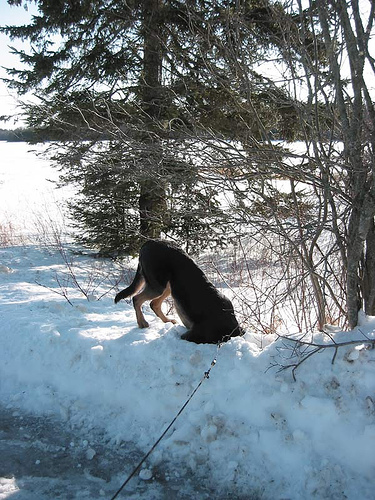

In [ ]:
############################
from PIL import Image
Image.open('archive/Images/413231421_43833a11f5.jpg')

/content/drive/MyDrive/captions/Image-Captioning-using-Attention-Mechanism-Local-Attention-and-Global-Attention-/test_folder/student_prize.PNG
the asian man is reading
BELU score: 6.32389162439519e-153
Prediction Caption(Beam=10): the asian man is reading
time took to Predict: 1 sec


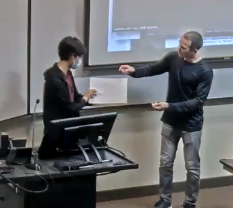

In [ ]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = '/content/drive/MyDrive/captions/Image-Captioning-using-Attention-Mechanism-Local-Attention-and-Global-Attention-/test_folder/student_prize.PNG'
print(image)
start = time.time()
real_caption = '<start> black dog is digging in the snow <end>'
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


print(result)
#remove <end> from result         
# result_join = ' '.join(result)
# result_final = result_join.rsplit(' ', 1)[0]

result_final=result

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

#print ('Real Caption:', real_caption)
print ('Prediction Caption(Beam=10):', result_final)

# plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open('/content/drive/MyDrive/captions/Image-Captioning-using-Attention-Mechanism-Local-Attention-and-Global-Attention-/test_folder/student_prize.PNG')

In [ ]:
pwd

'/content/drive/MyDrive/captions/Image-Captioning-using-Attention-Mechanism-Local-Attention-and-Global-Attention-'

/content/drive/MyDrive/captions/Image-Captioning-using-Attention-Mechanism-Local-Attention-and-Global-Attention-/test_folder/man.jpg
young girl in the trees
BELU score: 21.19738106741542
Prediction Caption(Beam=10): young girl in the trees
time took to Predict: 1 sec


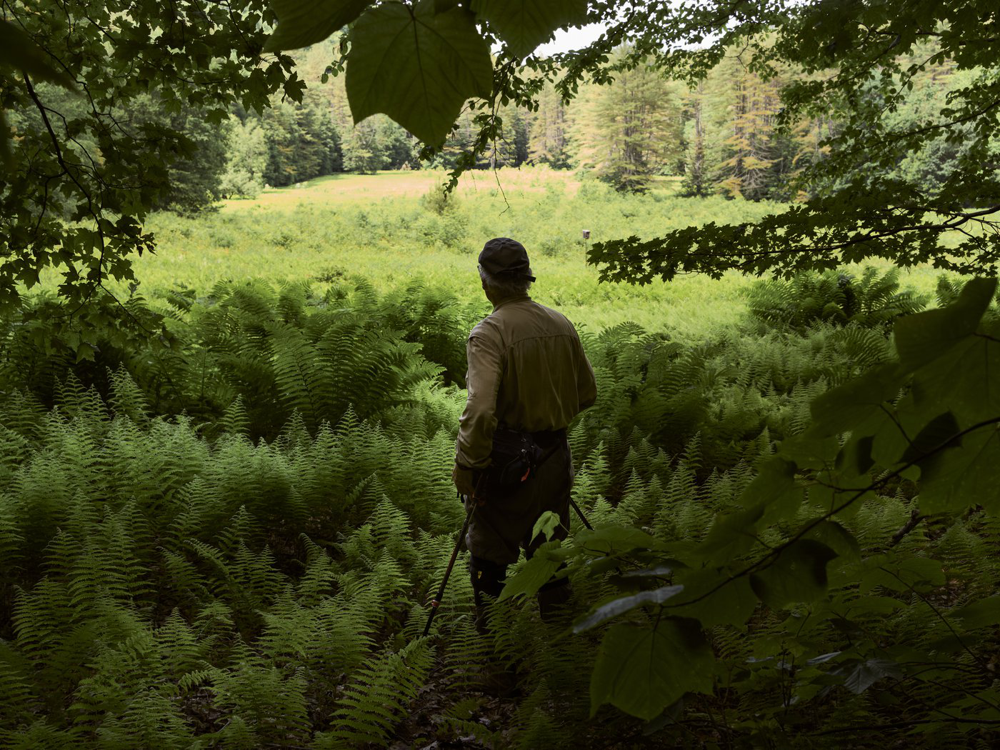

In [ ]:
# captions on the validation set

from PIL import Image

from nltk.translate.bleu_score import sentence_bleu

rid = np.random.randint(0, len(img_name_test))
image = '/content/drive/MyDrive/captions/Image-Captioning-using-Attention-Mechanism-Local-Attention-and-Global-Attention-/test_folder/man.jpg'
print(image)
start = time.time()
real_caption = '<start> black dog is digging in the snow <end>'
result, attention_plot = evaluate(image)
# result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
# We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions


first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

#remove "<unk>" in result
for i in result:
    if i=="<unk>":
        result.remove(i)


print(result)
#remove <end> from result         
# result_join = ' '.join(result)
# result_final = result_join.rsplit(' ', 1)[0]

result_final=result

real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = result_final.split()

score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
print(f"BELU score: {score*100}")

#print ('Real Caption:', real_caption)
print ('Prediction Caption(Beam=10):', result_final)

# plot_attention(image, result, attention_plot)

print(f"time took to Predict: {round(time.time()-start)} sec")
# opening the image
Image.open('//content/drive/MyDrive/captions/Image-Captioning-using-Attention-Mechanism-Local-Attention-and-Global-Attention-/test_folder/man.jpg')